In [1]:
# basic random seed
import os 
import random
import numpy as np 

DEFAULT_RANDOM_SEED = 42

def seedBasic(seed=DEFAULT_RANDOM_SEED):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seedBasic(seed=DEFAULT_RANDOM_SEED)

In [2]:
import time
import networkx as nx
import random
import matplotlib.pyplot as plt

NODES = 100
EDGES = 200

# Undirected unweighted graph

## Adjacency matrix

In [3]:
g = nx.gnm_random_graph(NODES, EDGES)

In [4]:
adjacency_matrix = nx.adjacency_matrix(g).todense()
adjacency_matrix[:3, :]

matrix([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0,

In [5]:
adjacency_matrix.shape

(100, 100)

In [6]:
def check_symmetric(a, rtol=0., atol=0.):
    return np.allclose(a, a.T, rtol=rtol, atol=atol)

In [7]:
check_symmetric(adjacency_matrix)

True

In [8]:
adj = np.argwhere(adjacency_matrix == 1)
adj[np.random.choice(range(adj.shape[0]), 7, replace=False)]

array([[53, 84],
       [70, 29],
       [ 8, 43],
       [54, 17],
       [23, 35],
       [20, 69],
       [82, 87]])

In [9]:
adj.shape

(400, 2)

## Adjacency list

In [10]:
adj_list = {_: [] for _ in range(adjacency_matrix.shape[0])}

for i in adj:
    adj_list[i[0]].append(i[1])
    
{i: adj_list[i] for i in range(10)}

{0: [9, 35, 49, 76, 92],
 1: [58, 69, 87],
 2: [14, 75],
 3: [4, 77, 94],
 4: [3, 8, 29],
 5: [76, 84, 93],
 6: [14, 74, 83, 93],
 7: [29, 30, 40, 51, 65, 74, 95, 99],
 8: [4, 34, 43, 49, 76, 86, 90, 97],
 9: [0, 12, 42, 56, 77, 96]}

In [11]:
list(map(lambda r: [int(i) for i in r.split()], nx.generate_adjlist(g)))[:10]

[[0, 35, 92, 76, 9, 49],
 [1, 87, 69, 58],
 [2, 14, 75],
 [3, 94, 4, 77],
 [4, 29, 8],
 [5, 93, 84, 76],
 [6, 14, 93, 83, 74],
 [7, 99, 30, 29, 51, 74, 95, 40, 65],
 [8, 90, 34, 49, 97, 43, 76, 86],
 [9, 77, 42, 56, 96, 12]]

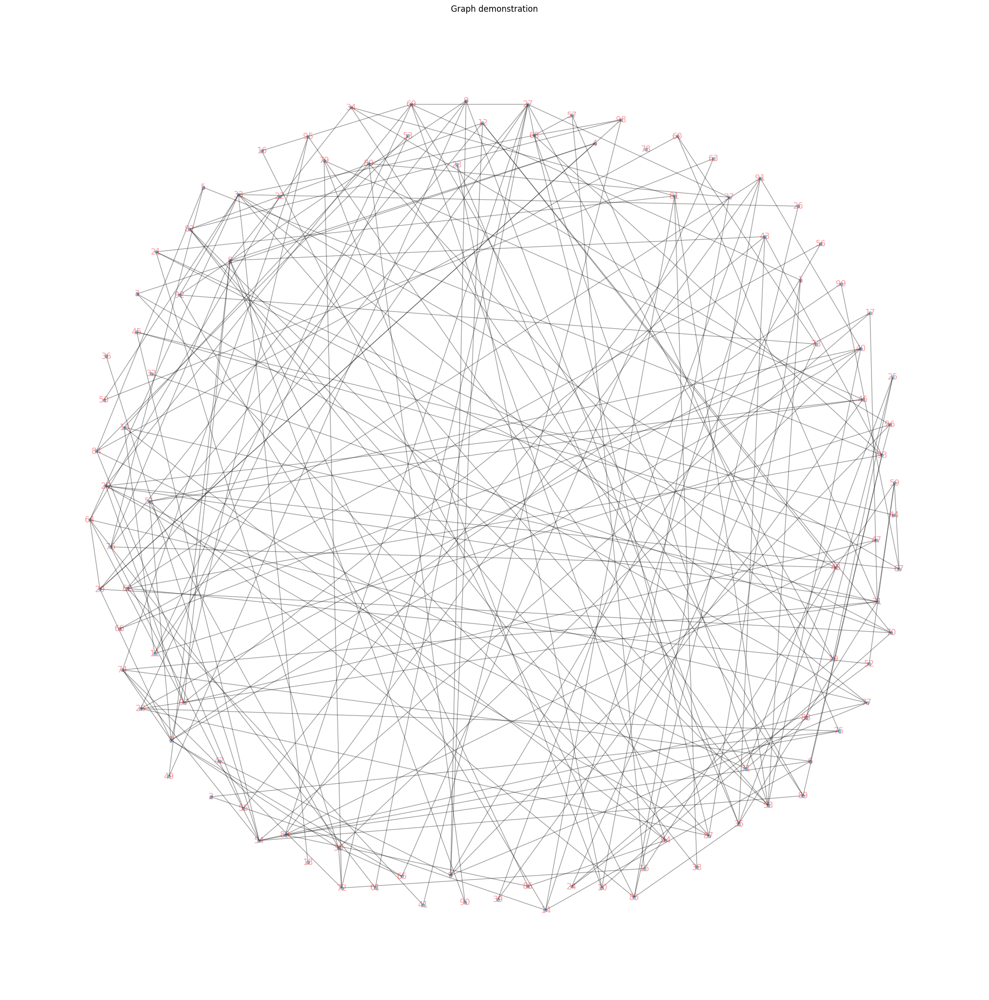

In [12]:
plt.figure(figsize=(20, 20))
pos = nx.spring_layout(g,  k=10., iterations=50, seed=DEFAULT_RANDOM_SEED)
nx.draw(g, pos, with_labels=True, node_size=20, alpha=0.4, font_size=12, font_color="r")

plt.title("Graph demonstration")
plt.savefig("./figures/graph_demo.png")
plt.show()

### Adjacency matrix


- Uses O($n^2$) memory
- It's quick to search and check for the presence or absence of a particular edge between any two nodes O(1)
- It's slow to go over all the edges
- Slow adding/removing a node is a complex O($n^2$) operation
- It's fast to add a new edge O(1)

### Adjacency list

- Use memory in anticipation for the number of edges (not the number of nodes), which can save a lot of memory if the adjacency matrix is sparse
- Finding the presence or absence of a specific edge between any two nodes slightly slower than with an O(k) matrix where k is the number of adjacent nodes
- Quickly iterate over all edges Because you can access any neighbor node directly
- Quickly add/remove node easier than matrix view
- It's fast to add a new edge O(1)

In [13]:
def dfs_edges(G, source=None, depth_limit=None):
    """Iterate over edges in a depth-first-search (DFS).

    Perform a depth-first-search over the nodes of `G` and yield
    the edges in order. This may not generate all edges in `G`
    (see `~networkx.algorithms.traversal.edgedfs.edge_dfs`).

    Parameters
    ----------
    G : NetworkX graph

    source : node, optional
       Specify starting node for depth-first search and yield edges in
       the component reachable from source.

    depth_limit : int, optional (default=len(G))
       Specify the maximum search depth.

    Yields
    ------
    edge: 2-tuple of nodes
       Yields edges resulting from the depth-first-search.

    Examples
    --------
    >>> G = nx.path_graph(5)
    >>> list(nx.dfs_edges(G, source=0))
    [(0, 1), (1, 2), (2, 3), (3, 4)]
    >>> list(nx.dfs_edges(G, source=0, depth_limit=2))
    [(0, 1), (1, 2)]

    Notes
    -----
    If a source is not specified then a source is chosen arbitrarily and
    repeatedly until all components in the graph are searched.

    The implementation of this function is adapted from David Eppstein's
    depth-first search function in PADS [1]_, with modifications
    to allow depth limits based on the Wikipedia article
    "Depth-limited search" [2]_.

    See Also
    --------
    dfs_preorder_nodes
    dfs_postorder_nodes
    dfs_labeled_edges
    :func:`~networkx.algorithms.traversal.edgedfs.edge_dfs`
    :func:`~networkx.algorithms.traversal.breadth_first_search.bfs_edges`

    References
    ----------
    .. [1] http://www.ics.uci.edu/~eppstein/PADS
    .. [2] https://en.wikipedia.org/wiki/Depth-limited_search
    """
    if source is None:
        # edges for all components
        nodes = G
    else:
        # edges for components with source
        nodes = [source]
    visited = set()
    if depth_limit is None:
        depth_limit = len(G)
    for start in nodes:
        if start in visited:
            continue
        visited.add(start)
        stack = [(start, depth_limit, iter(G[start]))]
        while stack:
            parent, depth_now, children = stack[-1]
            try:
                child = next(children)
                if child not in visited:
                    yield parent, child
                    visited.add(child)
                    if depth_now > 1:
                        stack.append((child, depth_now - 1, iter(G[child])))
            except StopIteration:
                stack.pop()

In [14]:
source = 0
path_edges = list(dfs_edges(g, source=source))
path_edges[:10], path_edges[-10:]

([(0, 35),
  (35, 31),
  (31, 20),
  (20, 97),
  (97, 43),
  (43, 14),
  (14, 81),
  (81, 58),
  (58, 68),
  (68, 93)],
 [(82, 38),
  (85, 16),
  (33, 50),
  (50, 63),
  (63, 65),
  (10, 23),
  (37, 55),
  (27, 61),
  (75, 2),
  (54, 36)])

In [15]:
path = [source] + [v for u, v in path_edges]
[i for i in path if i in set(path)] == path, len(list(set(path))), len(path)

(True, 99, 99)

In [16]:
path[:10], path[-10:]

([0, 35, 31, 20, 97, 43, 14, 81, 58, 68],
 [38, 16, 50, 63, 65, 23, 55, 61, 2, 36])

In [17]:
78 in path

False

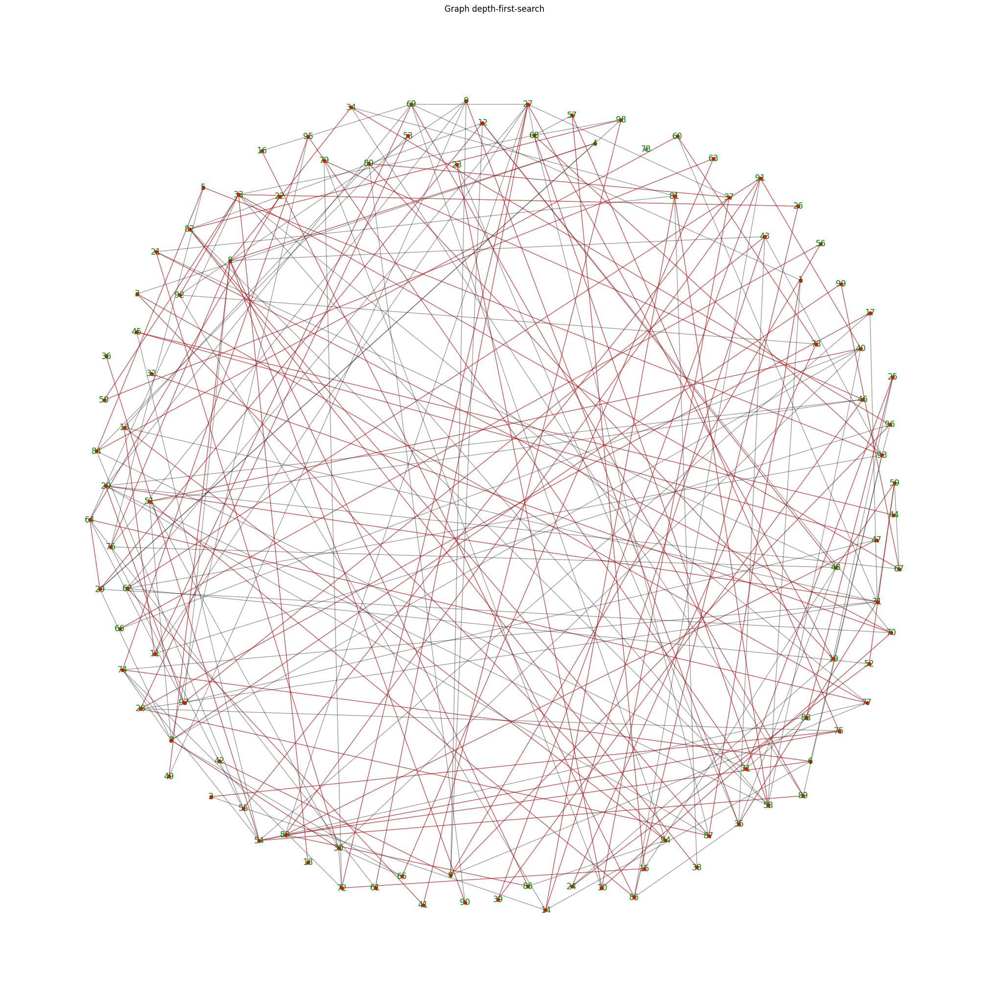

In [18]:
plt.figure(figsize=(20, 20))
pos = nx.spring_layout(g, k=10., iterations=50, seed=DEFAULT_RANDOM_SEED)
nx.draw(g, pos, node_color='k', alpha=0.4, node_size=20)

nx.draw_networkx_labels(g, pos, font_color="g", font_size=12)
nx.draw_networkx_nodes(g, pos, nodelist=path, node_color='r', node_size=20)
nx.draw_networkx_edges(g, pos, edgelist=path_edges, edge_color='r', width=1, alpha=0.4)
plt.axis('equal')
plt.title("Graph depth-first-search")
plt.savefig("./figures/graph_depth_first_search.png")
plt.show()

In [19]:
from collections import deque

def bfs_edges(G, source, neighbors=None, depth_limit=None, sort_neighbors=None):
    """Iterate over edges in a breadth-first search.

    The breadth-first search begins at `source` and enqueues the
    neighbors of newly visited nodes specified by the `neighbors`
    function.

    Parameters
    ----------
    G : NetworkX graph

    source : node
        Starting node for the breadth-first search; this function
        iterates over only those edges in the component reachable from
        this node.

    neighbors : function
        A function that takes a newly visited node of the graph as input
        and returns an *iterator* (not just a list) of nodes that are
        neighbors of that node. If not specified, this is just the
        ``G.neighbors`` method, but in general it can be any function
        that returns an iterator over some or all of the neighbors of a
        given node, in any order.

    depth_limit : int, optional(default=len(G))
        Specify the maximum search depth

    sort_neighbors : function
        A function that takes the list of neighbors of given node as input, and
        returns an *iterator* over these neighbors but with custom ordering.

    Yields
    ------
    edge
        Edges in the breadth-first search starting from `source`.

    Examples
    --------
    >>> G = nx.path_graph(3)
    >>> print(list(nx.bfs_edges(G, 0)))
    [(0, 1), (1, 2)]
    >>> print(list(nx.bfs_edges(G, source=0, depth_limit=1)))
    [(0, 1)]

    Notes
    -----
    This implementation is from `PADS`_, which was in the public domain
    when it was first accessed in July, 2004.  The modifications
    to allow depth limits are based on the Wikipedia article
    "`Depth-limited-search`_".

    .. _PADS: http://www.ics.uci.edu/~eppstein/PADS/BFS.py
    .. _Depth-limited-search: https://en.wikipedia.org/wiki/Depth-limited_search
    """
    if callable(sort_neighbors):
        _neighbors = neighbors
        neighbors = lambda node: iter(sort_neighbors(_neighbors(node)))

    visited = {source}
    if depth_limit is None:
        depth_limit = len(G)
    queue = deque([(source, depth_limit, neighbors(source))])
    while queue:
        parent, depth_now, children = queue[0]
        try:
            child = next(children)
            if child not in visited:
                yield parent, child
                visited.add(child)
                if depth_now > 1:
                    queue.append((child, depth_now - 1, neighbors(child)))
        except StopIteration:
            queue.popleft()

In [20]:
source = 0
path_edges = list(bfs_edges(g, source=source, neighbors=g.neighbors))
path_edges[:10], path_edges[-10:]


([(0, 35),
  (0, 92),
  (0, 76),
  (0, 9),
  (0, 49),
  (35, 31),
  (35, 43),
  (35, 48),
  (35, 85),
  (35, 23)],
 [(64, 61),
  (24, 19),
  (45, 44),
  (84, 55),
  (84, 71),
  (70, 32),
  (7, 65),
  (62, 41),
  (19, 25),
  (71, 88)])

In [21]:
path = [source] + [v for u, v in path_edges]
[i for i in path if i in set(path)] == path, len(list(set(path))), len(path)

(True, 99, 99)

In [22]:
path[:10], path[-10:]

([0, 35, 92, 76, 9, 49, 31, 43, 48, 85],
 [61, 19, 44, 55, 71, 32, 65, 41, 25, 88])

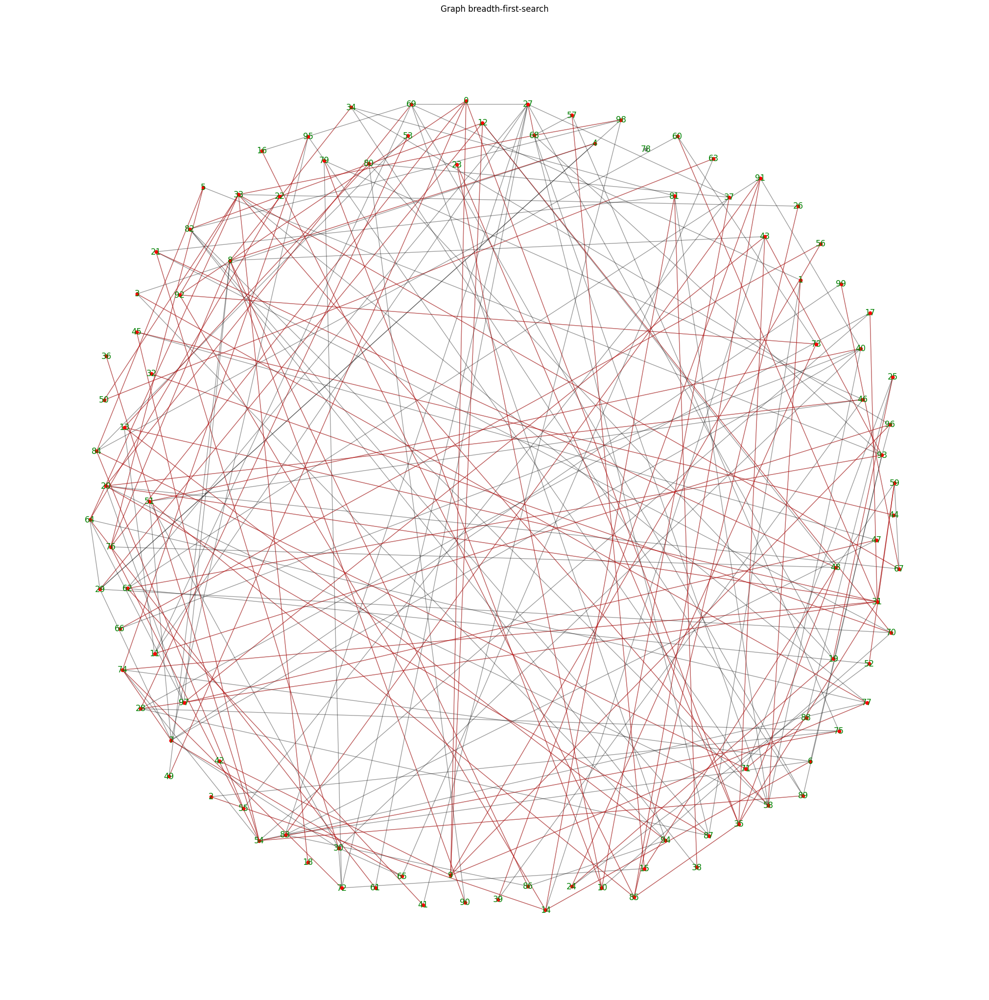

In [23]:
plt.figure(figsize=(20, 20))

pos = nx.spring_layout(g, k=10., iterations=50, seed=DEFAULT_RANDOM_SEED)
nx.draw(g, pos, node_color='k', alpha=0.4, node_size=20)

nx.draw_networkx_labels(g, pos, font_color="g", font_size=12)
nx.draw_networkx_nodes(g, pos, nodelist=path, node_color='r', node_size=20)
nx.draw_networkx_edges(g, pos, edgelist=path_edges, edge_color='r', width=1, alpha=0.4)

plt.axis('equal')
plt.title("Graph breadth-first-search")
plt.savefig("./figures/graph_breadth_first_search.png")
plt.show()



#### The shortest path between two random vertices

In [24]:
source = np.random.choice(range(0, adjacency_matrix.shape[0]))
destination = np.random.choice(list(set(range(0, adjacency_matrix.shape[0])) - {source,}))
path_edges = list(bfs_edges(g, source=source, neighbors=g.neighbors))
path = [source] + [v for u, v in path_edges]
path = np.array(path)
path = path[:np.argwhere(path == destination)[0][0]+1]
source, destination, path

(7,
 53,
 array([ 7, 99, 30, 29, 51, 74, 95, 40, 65, 67, 72, 21, 64, 98, 12,  4, 70,
        46, 85, 54,  6, 31, 71, 91, 66, 58, 63, 59, 33, 20, 27, 15, 79, 81,
        48, 97, 22, 77, 61, 41, 82, 68,  9,  3,  8, 10, 32, 39, 26, 35, 16,
        75, 89, 76, 45, 17, 36, 14, 93, 83, 28, 60, 13, 25, 88, 84, 62, 56,
         1, 50, 52, 18, 92, 87, 69, 11, 19, 37, 57, 34, 38, 43, 47,  0, 42,
        96, 94, 90, 49, 86, 23,  2,  5, 44, 53]))

In [25]:
path_edges = [(path[i-1], path[i]) for i in range(1, len(path))]

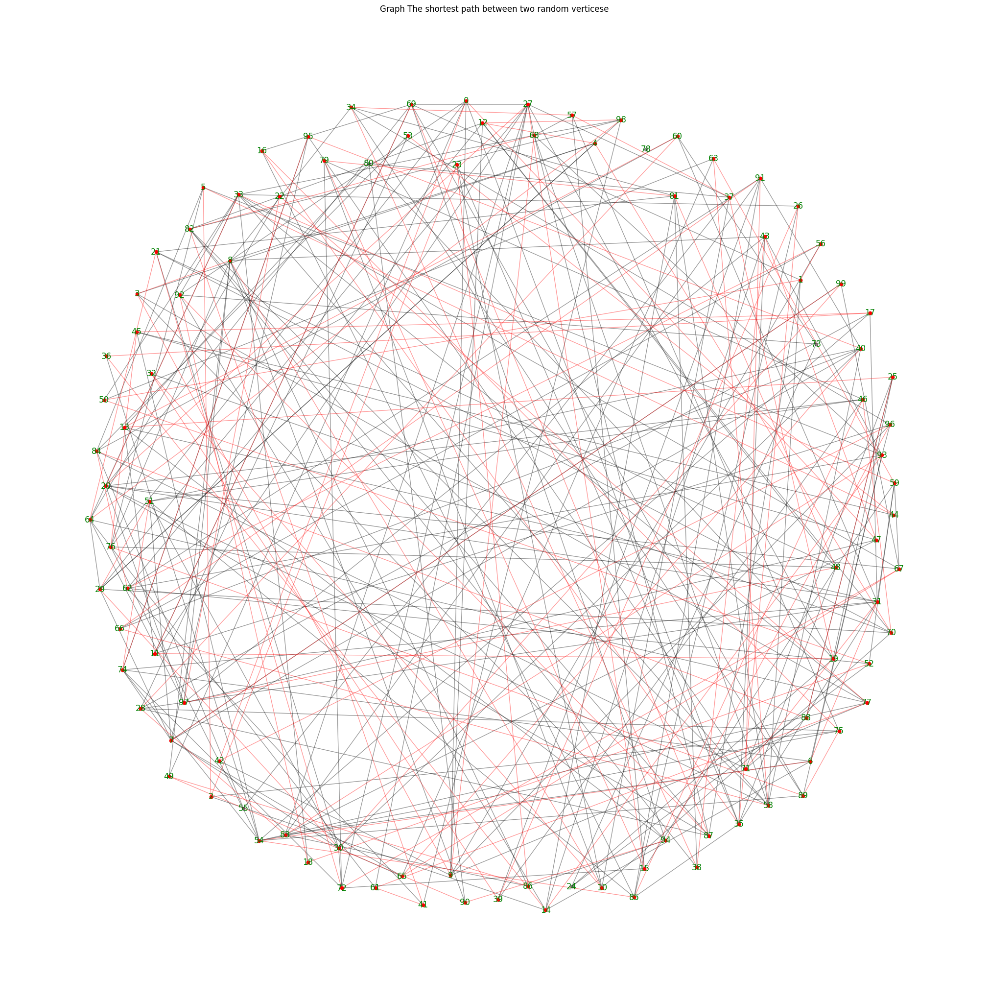

In [26]:
plt.figure(figsize=(20, 20))

pos = nx.spring_layout(g, k=10., iterations=50, seed=DEFAULT_RANDOM_SEED)
nx.draw(g, pos, node_color='k', alpha=0.4, node_size=20)

nx.draw_networkx_labels(g, pos, font_color="g", font_size=12)
nx.draw_networkx_nodes(g, pos, nodelist=path, node_color='r', node_size=20)
nx.draw_networkx_edges(g, pos, edgelist=path_edges, edge_color='r', width=1, alpha=0.4)

plt.axis('equal')
plt.title("Graph The shortest path between two random verticese")
plt.savefig(f"./figures/graph_shortest_path_between_two_random_verticese.png")
plt.show()

